## Vehicle Detection Project

The goals / steps of this project are the following:

* Perform a Histogram of Oriented Gradients (HOG) feature extraction on a labeled training set of images and train a classifier Linear SVM classifier
* Optionally, you can also apply a color transform and append binned color features, as well as histograms of color, to your HOG feature vector.
* Note: for those first two steps don't forget to normalize your features and randomize a selection for training and testing.
* Implement a sliding-window technique and use your trained classifier to search for vehicles in images.
* Run your pipeline on a video stream (start with the test_video.mp4 and later implement on full project_video.mp4) and create a heat map of recurring detections frame by frame to reject outliers and follow detected vehicles.
* Estimate a bounding box for vehicles detected.

---
## 1. Data Preparation

In [1]:
import numpy as np
import cv2
import csv
import glob 
import time

import matplotlib.pyplot as plt
import matplotlib.image as mpimg

from mpl_toolkits.mplot3d import Axes3D 
from sklearn.preprocessing import StandardScaler
from skimage.feature import hog 
from sklearn.model_selection import train_test_split
from sklearn.svm import LinearSVC
from scipy.ndimage.measurements import label
from moviepy.editor import VideoFileClip
%matplotlib inline

In [147]:
#----------------------------------------------------------
#Udacity Provided Vehicle Data/Non-Vehicle Data Extraction 
#----------------------------------------------------------

#CSV File Open and Store 
f = open('./training_dataset/object-detection-crowdai/labels.csv', 'rt')
lists = csv.reader(f)
matrix=[]
for list in lists:
    matrix.append(list)

matrix.pop(0) # Remove First "Index" Row
cind=8792 #To add to conventional dataset, numbering staring from 8792
tind=0
pind=0
rind=8968 #To add to conventional dataset, numbering staring from 8968

#Image File Reading, Cropping, Resizing
for image in matrix:
    filename=image[4]
    image_file="C:\\Users\\user\\Desktop\\Github Project\\Udacity\\CarND-Vehicle-Detection\\training_dataset\\object-detection-crowdai\\"+filename    
    image_file=mpimg.imread(image_file)
    x_min = int(image[0])
    y_min = int(image[1])
    x_max = int(image[2])
    y_max = int(image[3])
    
    #Implement Non-vehicle Image (Random Image in non-vehicle image region)
    x_min_rand=np.random.randint(low=0,high=1700)
    x_max_rand=int(x_min_rand+200)
    y_min_rand=np.random.randint(low=0,high=250)
    y_max_rand=int(y_min_rand+200)
    
    #Image cropping, resizing, writing 
    if y_max-y_min > 0 and x_max-x_min > 0:
        crop_img = image_file[y_min:y_max, x_min:x_max] 
        rand_img = image_file[y_min_rand:y_max_rand, x_min_rand:x_max_rand] 
        image_to_write= cv2.cvtColor(crop_img, cv2.COLOR_RGB2BGR)
        image_to_write_rand = cv2.cvtColor(rand_img, cv2.COLOR_RGB2BGR)
        resized_img = cv2.resize(image_to_write, (64,64))
        resized_img_rand = cv2.resize(image_to_write_rand, (64,64))
        if image[5] == 'Car':
            cind+=1
            rind+=1
            cv2.imwrite(r'.\training_dataset\data_fullset\vehicle%s.png'% (cind),resized_img)
            cv2.imwrite(r'.\training_dataset\data_fullset\nonvehicle%s.png'% (rind),resized_img_rand)
        elif image[5] == 'Truck':
            tind+=1
            cv2.imwrite(r'.\training_dataset\additional_dataset\Truck%s.png'% (tind),resized_img)
        elif image[5] == 'Pedestrian':
            pind+=1
            cv2.imwrite(r'.\training_dataset\additional_dataset\Pedestrian%s.png'% (pind),resized_img)
        else:
            pass
    else:
        print("Wrong Image Size...")

Wrong Image Size...
Wrong Image Size...
Wrong Image Size...
Wrong Image Size...


My dataset has  8792  cars and 8968  non-cars
of size:  (64, 64, 3)  and data type: uint8


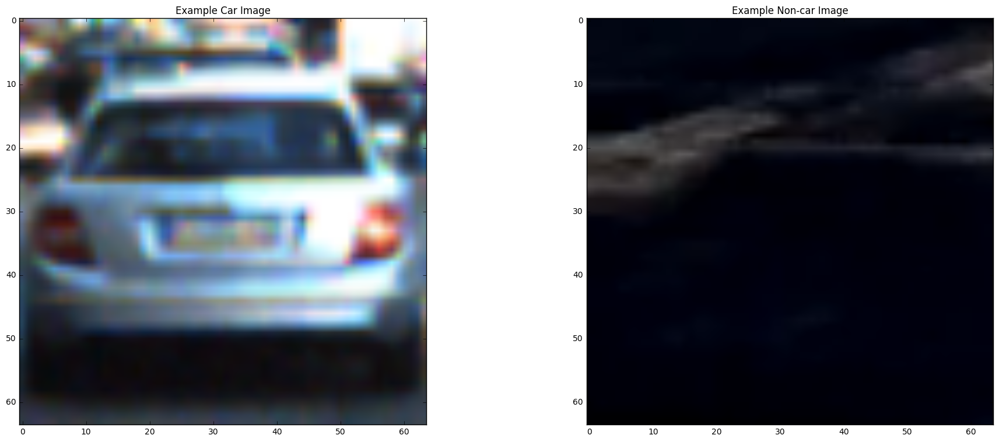

In [2]:
#-------------------------------------------
#Data Visualization (GTI+KITTI Data)
#-------------------------------------------
  
images=glob.glob('./training_dataset/original_dataset/*.png')
cars=[]
notcars=[]

for image in images:
    if 'non' in image:
        notcars.append(image)
    else:
        cars.append(image)
        
#Define a finction to return some characteristics of the data
def data_look(car_list, notcar_list):
    data_dict={}
    #Define a key in data_dict "n_cars" and store the number
    data_dict["n_cars"]=len(car_list)
    #Define a key "n_notcars" and store the number
    data_dict["n_notcars"]=len(notcar_list)
    #Read in a test image, either car or notcar
    example_image=cv2.imread(car_list[0])
    #Define a key "image_shape" and store the test image shape
    data_dict["image_shape"]=example_image.shape
    #Define a key "data_type" and store the data type
    data_dict["data_type"]=example_image.dtype
    
    return data_dict

data_info = data_look(cars, notcars)

print('My dataset has ', 
      data_info["n_cars"], ' cars and', 
      data_info["n_notcars"], ' non-cars')
print('of size: ',data_info["image_shape"], ' and data type:', 
      data_info["data_type"])

# Just for fun choose random car / not-car indices and plot example images   
car_ind = np.random.randint(0, len(cars))
notcar_ind = np.random.randint(0, len(notcars))
    
# Read in car / not-car images
car_image = cv2.imread(cars[car_ind])
car_image = cv2.cvtColor(car_image, cv2.COLOR_BGR2RGB)
notcar_image = cv2.imread(notcars[notcar_ind])
notcar_image = cv2.cvtColor(notcar_image, cv2.COLOR_BGR2RGB)

# Plot the examples
fig = plt.figure(figsize=(23,9))
plt.subplot(121)
plt.imshow(car_image)
plt.title('Example Car Image')
plt.subplot(122)
plt.imshow(notcar_image)
plt.title('Example Non-car Image')

## 2. Feature Extraction (HOG, Spatial, Color Histogram)

In [3]:
#----------------------------------
#Function for feature Extraction
#----------------------------------

#Spatial Feature Function
def bin_spatial(img, size=(32, 32)):
    features = cv2.resize(img, size).ravel() 
    return features

# Color Histogram Features Function
def color_hist(img, nbins=32, bins_range=(0, 256)):
    channel1_hist = np.histogram(img[:,:,0], bins=nbins, range=bins_range)
    channel2_hist = np.histogram(img[:,:,1], bins=nbins, range=bins_range)
    channel3_hist = np.histogram(img[:,:,2], bins=nbins, range=bins_range)
    # Concatenate the histograms into a single feature vector
    hist_features = np.concatenate((channel1_hist[0], channel2_hist[0], channel3_hist[0]))
    return hist_features

#Hog Feature Function
def get_hog_features(img, orient, pix_per_cell, cell_per_block, vis=False, feature_vec=True):
    if vis == True:
        features, hog_image = hog(img, orientations=orient, pixels_per_cell=(pix_per_cell,pix_per_cell),
                                 cells_per_block=(cell_per_block, cell_per_block),transform_sqrt=False,
                                 visualise=vis, feature_vector=feature_vec)
        return features, hog_image
    else:
        features = hog(img, orientations=orient, pixels_per_cell=(pix_per_cell,pix_per_cell),
                       cells_per_block=(cell_per_block, cell_per_block),transform_sqrt=False,
                       visualise=vis, feature_vector=feature_vec)
        return features
    
#Feature Extraction Function for Training
def extract_features(imgs, color_space='RGB', spatial_size=(32, 32),
                     hist_bins=32, orient=9, pix_per_cell=8, cell_per_block=2, 
                     hog_channel='ALL',spatial_feat=True, hist_feat=True, hog_feat=True):
    # Create a list to append feature vectors
    features = []
    # Iterate through the list of images
    for file in imgs:
        file_features = []
        # Read in each one by one
        image = cv2.imread(file)
        # apply color conversion
        if color_space == 'RGB':
            feature_image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        elif color_space == 'HSV':
             feature_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
        elif color_space == 'LUV':
             feature_image = cv2.cvtColor(image, cv2.COLOR_BGR2LUV)
        elif color_space == 'HLS':
             feature_image = cv2.cvtColor(image, cv2.COLOR_BGR2HLS)
        elif color_space == 'YUV':
             feature_image = cv2.cvtColor(image, cv2.COLOR_BGR2YUV)
        elif color_space == 'YCrCb':
             feature_image = cv2.cvtColor(image, cv2.COLOR_BGR2YCrCb)
        else: 
            print ("Designate Color Space...")

        #Whether to Use Spatial Feature or not
        if spatial_feat == True:
            spatial_features = bin_spatial(feature_image, size=spatial_size)
            file_features.append(spatial_features)
            
        #Whether to Use Histogram Feature or not
        if hist_feat == True:
            # Apply color_hist()
            hist_features = color_hist(feature_image, nbins=hist_bins)
            file_features.append(hist_features)
        
        #Whether to Hog Feature or not
        if hog_feat == True:
            # Call get_hog_features()
            if hog_channel == 'ALL':
                hog_features = []
                for channel in range(feature_image.shape[2]):
                    hog_features.append(get_hog_features(feature_image[:,:,channel], 
                                        orient, pix_per_cell, cell_per_block, 
                                        vis=False, feature_vec=True))
                hog_features = np.ravel(hog_features)  
            else:
                hog_features = get_hog_features(feature_image[:,:,hog_channel], orient, 
                            pix_per_cell, cell_per_block, vis=False, feature_vec=True)
            # Append the new feature vector to the features list
            file_features.append(hog_features)
        features.append(np.concatenate(file_features))
    # Return list of feature vectors
    return features


## 3. Data Normalization & Training (SVM Model)

In [4]:
#-------------------------------------------
#Training/Test Data & Normalization Function 
#-------------------------------------------

def data_hand (cars_features, notcars_features):
    X = np.vstack((car_features, notcar_features)).astype(np.float64)
    # Fit a per-column scaler
    X_scaler=StandardScaler().fit(X)
    # Apply the scaler to X
    scaled_X=X_scaler.transform(X)
    y=np.hstack((np.ones(len(car_features)),np.zeros(len(notcar_features))))
    #Split up data into randomized training and test sets
    rand_state=np.random.randint(0,100)
    X_train, X_test, y_train, y_test = train_test_split(scaled_X,y,test_size=0.2, random_state=rand_state)
    return X_train, X_test, y_train, y_test, X_scaler

In [42]:
#--------------------------------------------
#Extract Features & Training with Vairables 
#-------------------------------------------

#Training Variables
color_space = 'YCrCb' # RGB, HSV, LUV, HLS, YUV, YCrCb
spatial_size=(32,32) #Spatial Size
hist_bins=32 # Number of Histogram Bin
orient = 9  # HOG orientations
pix_per_cell = 8 # HOG pixels per cell
cell_per_block = 2 # HOG cells per block
hog_channel = 'ALL' # 0, 1, 2, or "ALL"
spatial_feat = True # Spatial features on or off
hist_feat = True # Histogram features on or off
hog_feat = True # HOG features on or off

#Feature Extraction
car_features = extract_features(cars, color_space, spatial_size, hist_bins, orient, pix_per_cell, cell_per_block, 
                                hog_channel, spatial_feat, hist_feat, hog_feat)
notcar_features = extract_features(notcars, color_space, spatial_size, hist_bins, orient, pix_per_cell, cell_per_block, 
                                   hog_channel, spatial_feat, hist_feat, hog_feat)

#Data Handling
X_train, X_test, y_train, y_test, X_scaler = data_hand(car_features,notcar_features) 
print("Ready to be Trained...")

Ready to be Trained...


In [43]:
#-------------------
# Training & Result 
#-------------------

print('Using: ',color_space,'color channel',spatial_size[0],'by',spatial_size[1],'spatial size and ',hist_bins,'bins')
print('Using: ',orient,'orientations',pix_per_cell,'pixels per cell and', cell_per_block,'cells per block')
print('With',hog_channel,'hog channel,')
print('Feature vector length:', len(X_train[0]))
# Use a linear SVC 
svc = LinearSVC()
# Check the training time for the SVC
t=time.time()
svc.fit(X_train, y_train)
t2 = time.time()
print(round(t2-t, 2), 'Seconds to train SVC...')
# Check the score of the SVC
print('Test Accuracy of SVC = ', round(svc.score(X_test, y_test), 4))
# Check the prediction time for a single sample
t=time.time()

Using:  YCrCb color channel 32 by 32 spatial size and  32 bins
Using:  9 orientations 8 pixels per cell and 2 cells per block
With ALL hog channel,
Feature vector length: 8460
11.57 Seconds to train SVC...
Test Accuracy of SVC =  0.993


## 4. Sliding Window Search

In [44]:
#------------------------------------------------------------
# Apply SVM Training Result to find cars with sliding windows
#------------------------------------------------------------

# Define a single function that can extract features using hog sub-sampling and make predictions
def find_cars(img, color_space, hog_channel, xstart, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins):
    
    #Make a empty list for saving rectangles
    rectangles = []
    
    img_tosearch = img[ystart:ystop,xstart:,:]
    if color_space == 'RGB':
        ctrans_tosearch = cv2.cvtColor(img_tosearch, cv2.COLOR_BGR2RGB)
    elif color_space == 'HSV':
        ctrans_tosearch = cv2.cvtColor(img_tosearch, cv2.COLOR_BGR2HSV)
    elif color_space == 'LUV':
        ctrans_tosearch = cv2.cvtColor(img_tosearch, cv2.COLOR_BGR2LUV)
    elif color_space == 'HLS':
        ctrans_tosearch = cv2.cvtColor(img_tosearch, cv2.COLOR_BGR2HLS)
    elif color_space == 'YUV':
        ctrans_tosearch = cv2.cvtColor(img_tosearch, cv2.COLOR_BGR2YUV)
    elif color_space == 'YCrCb':
        ctrans_tosearch = cv2.cvtColor(img_tosearch, cv2.COLOR_BGR2YCrCb)
    else: 
        print ("Designate Color Space...")
    
    #Rescale image with scale size 
    if scale != 1:
        imshape = ctrans_tosearch.shape
        ctrans_tosearch = cv2.resize(ctrans_tosearch, (np.int(imshape[1]/scale), np.int(imshape[0]/scale)))
        
    if hog_channel == 'ALL':
        ch1 = ctrans_tosearch[:,:,0]
        ch2 = ctrans_tosearch[:,:,1]
        ch3 = ctrans_tosearch[:,:,2]
    else:
        ch1 = ctrans_tosearch[:,:,hog_channel]

    # Define blocks and steps as above
    nxblocks = (ch1.shape[1] // pix_per_cell) - cell_per_block + 1
    nyblocks = (ch1.shape[0] // pix_per_cell) - cell_per_block + 1 
    nfeat_per_block = orient*cell_per_block**2
    
    # 64 was the orginal sampling rate, with 8 cells and 8 pix per cell
    window = 64
    nblocks_per_window = (window // pix_per_cell) - cell_per_block + 1
    cells_per_step = 2  # Instead of overlap, define how many cells to step
    nxsteps = (nxblocks - nblocks_per_window) // cells_per_step
    nysteps = (nyblocks - nblocks_per_window) // cells_per_step
    
    # Compute individual channel HOG features for the entire image
    if hog_channel == 'ALL':
        hog1 = get_hog_features(ch1, orient, pix_per_cell, cell_per_block, feature_vec=False)
        hog2 = get_hog_features(ch2, orient, pix_per_cell, cell_per_block, feature_vec=False)
        hog3 = get_hog_features(ch3, orient, pix_per_cell, cell_per_block, feature_vec=False)
    else:
        hog1 = get_hog_features(ch1, orient, pix_per_cell, cell_per_block, feature_vec=False)
    
    for xb in range(nxsteps):
        for yb in range(nysteps):
            ypos = yb*cells_per_step
            xpos = xb*cells_per_step
            # Extract HOG for this patch
            if hog_channel == 'ALL':
                hog_feat1 = hog1[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
                hog_feat2 = hog2[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
                hog_feat3 = hog3[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
                hog_features = np.hstack((hog_feat1, hog_feat2, hog_feat3))
            else:
                hog_feat1 = hog1[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel()
                hog_features = hog_feat1

            xleft = xpos*pix_per_cell
            ytop = ypos*pix_per_cell

            # Extract the image patch
            subimg = cv2.resize(ctrans_tosearch[ytop:ytop+window, xleft:xleft+window], (64,64))
          
            # Get color features
            spatial_features = bin_spatial(subimg, size=spatial_size)
            hist_features = color_hist(subimg, nbins=hist_bins)

            # Scale features and make a prediction
            test_features = X_scaler.transform(np.hstack((spatial_features, hist_features, hog_features)).reshape(1, -1))    
            #test_features = X_scaler.transform(np.hstack((shape_feat, hist_feat)).reshape(1, -1))    
            test_prediction = svc.predict(test_features)
            #print(test_prediction)
            if test_prediction == 1:
                xbox_left = np.int(xleft*scale)
                ytop_draw = np.int(ytop*scale)
                win_draw = np.int(window*scale)
                rectangles.append(((xbox_left+xstart, ytop_draw+ystart),(xbox_left+win_draw+xstart,ytop_draw+win_draw+ystart))) 
                
    return rectangles


# Draw Box Function
def draw_boxes(image, bboxes, color=(0, 255, 0), thick=4):
    # make a copy of the image
    draw_image = np.copy(image)
    for bbox in bboxes:
        cv2.rectangle(draw_image, bbox[0], bbox[1], color, thick)
    # return the image copy with boxes drawn
    
    return draw_image 

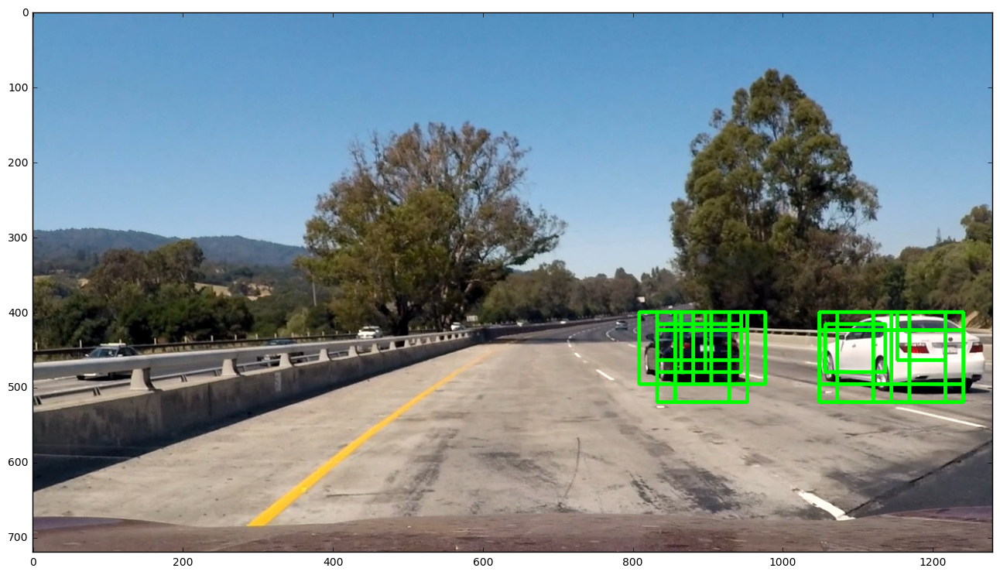

In [46]:
#------------------
# Test Image
#------------------

test_img = cv2.imread('./test_images/test1.jpg')

#Variables
color_space = 'YCrCb' # RGB, HSV, LUV, HLS, YUV, YCrCb
xstart=np.int(test_img.shape[1]/2)
spatial_size=(32,32) #Spatial Size
hist_bins=32 # Number of Histogram Bin
orient = 9  # HOG orientations
pix_per_cell = 8 # HOG pixels per cell
cell_per_block = 2 # HOG cells per block
hog_channel = 'ALL' # 0, 1, 2, or "ALL"

#Different window size & location 

ystart=400
ystop=500
scale=1.0
rectangles1 = find_cars(test_img, color_space, hog_channel, xstart, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)

ystart=400
ystop=550
scale=1.5
rectangles2 = find_cars(test_img, color_space, hog_channel, xstart, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)

ystart=500
ystop=700
scale=2.0
rectangles3 = find_cars(test_img, color_space, hog_channel, xstart, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)

rectangles=rectangles1+rectangles2+rectangles3

#Test
test_img = cv2.cvtColor(test_img, cv2.COLOR_BGR2RGB)
imageon_box = draw_boxes(test_img,rectangles)
plt.figure(figsize=(21,9))
plt.imshow(imageon_box)

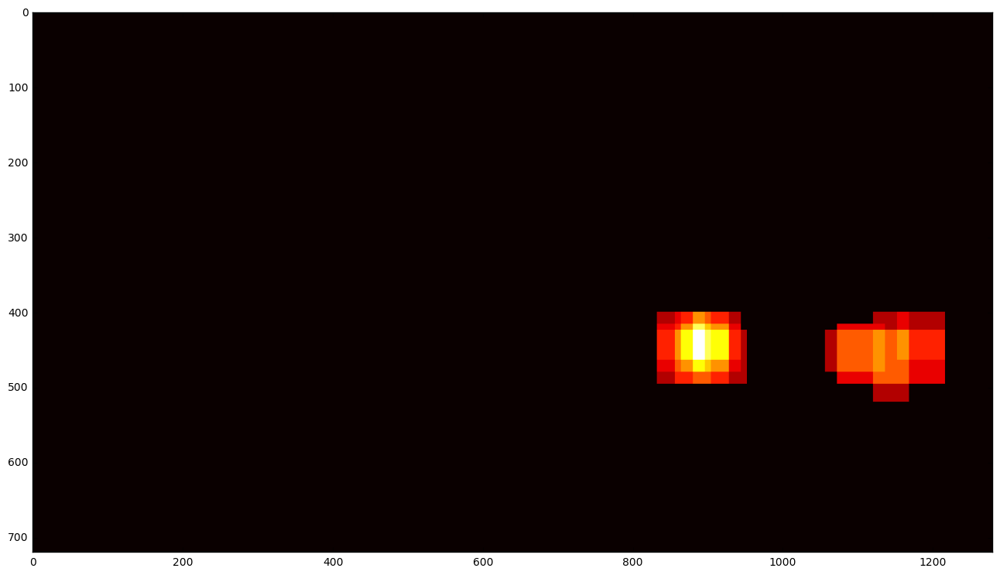

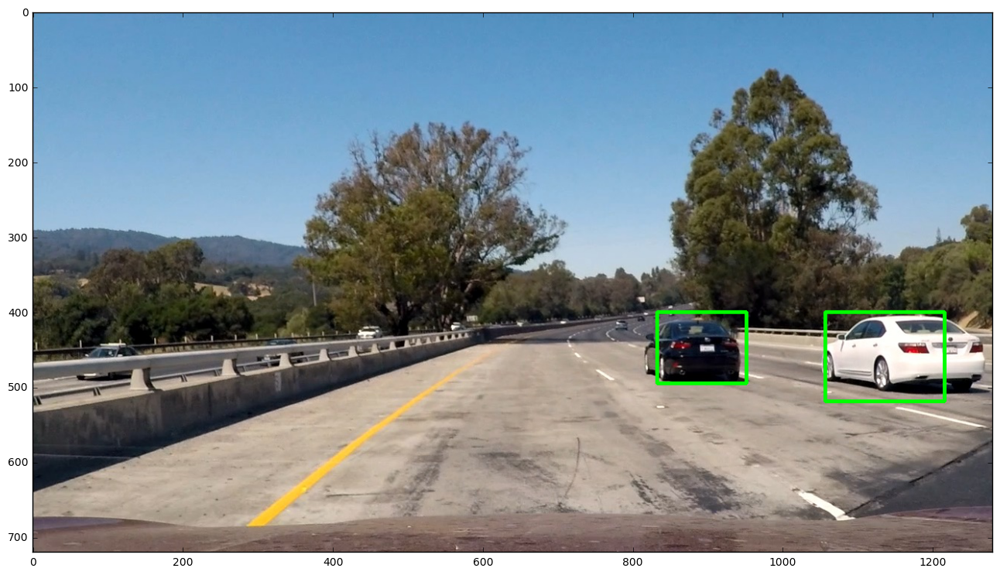

In [47]:
#----------------------
# Heat map Functions
#----------------------

#Heat Map Drawing
def add_heat(heatmap, bbox_list):
    # Iterate through list of bboxes
    for box in bbox_list:
        # Add += 1 for all pixels inside each bbox
        # Assuming each "box" takes the form ((x1, y1), (x2, y2))
        heatmap[box[0][1]:box[1][1], box[0][0]:box[1][0]] += 1

    # Return updated heatmap
    return heatmap

#Heatmap Threshold 
def apply_threshold(heatmap, threshold):
    # Zero out pixels below the threshold
    heatmap[heatmap <= threshold] = 0
    # Return thresholded map
    return heatmap

#Labeled Box Drawing 
def draw_labeled_bboxes(img,labels):
    for car_number in range(1,labels[1]+1):
        #Find pixels with each car_number label value
        nonzero=(labels[0] == car_number).nonzero()
        #Identify x and y values of pixels
        nonzeroy=np.array(nonzero[0])
        nonzerox=np.array(nonzero[1])
        #Define a tight bounding box!!
        bbox=((np.min(nonzerox),np.min(nonzeroy)),(np.max(nonzerox),np.max(nonzeroy)))
        cv2.rectangle(img, bbox[0], bbox[1], (0,255,0), 4)
    
    return img        

heat = np.zeros_like(test_img[:,:,0])
heat = add_heat(heat,rectangles)
heat = apply_threshold(heat,2)
plt.figure(figsize=(21,9))
plt.imshow(heat, cmap='hot')

labels=label(heat)
draw_img=draw_labeled_bboxes(np.copy(test_img),labels)
plt.figure(figsize=(21,9))
plt.imshow(draw_img)

## 5. Pipeline for Image & Video

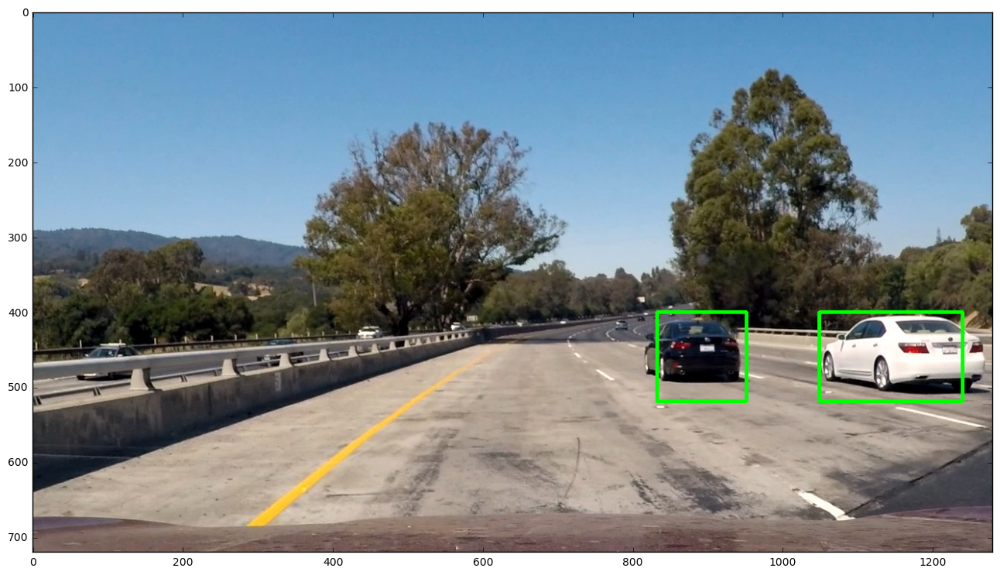

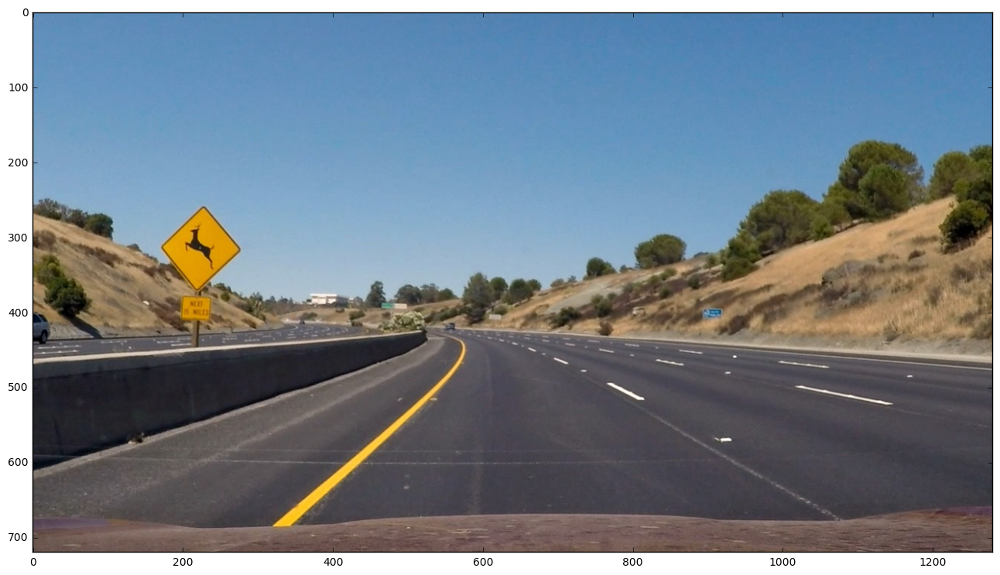

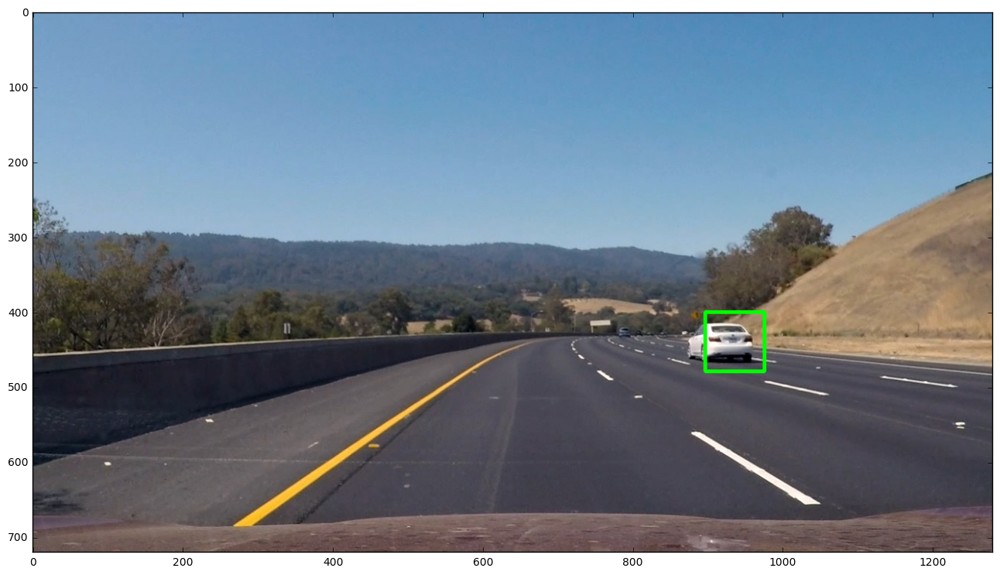

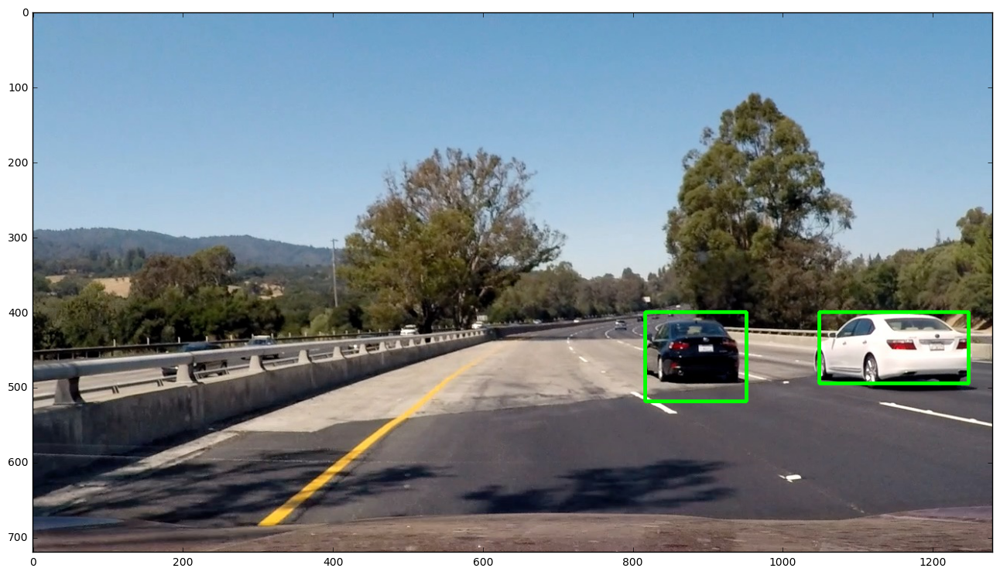

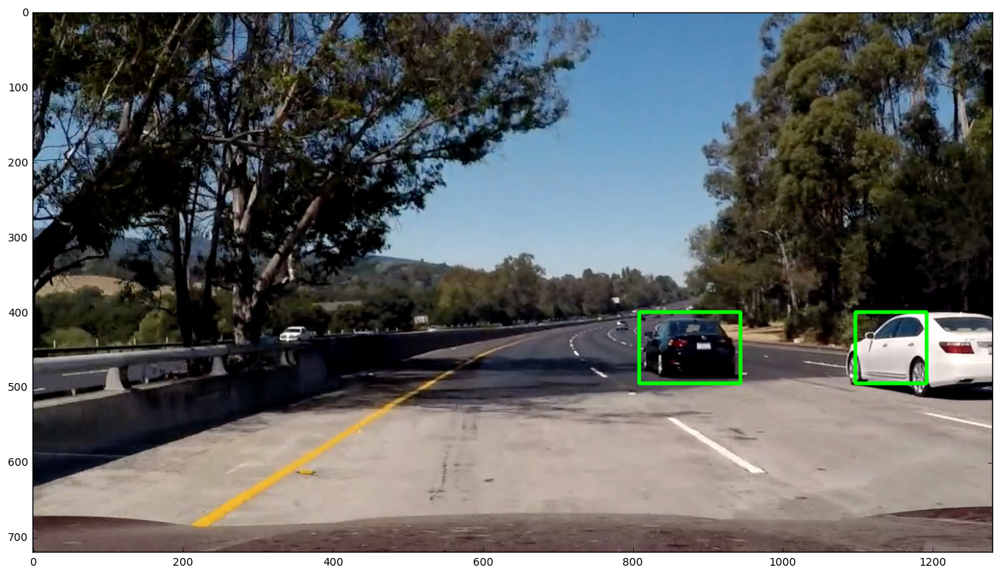

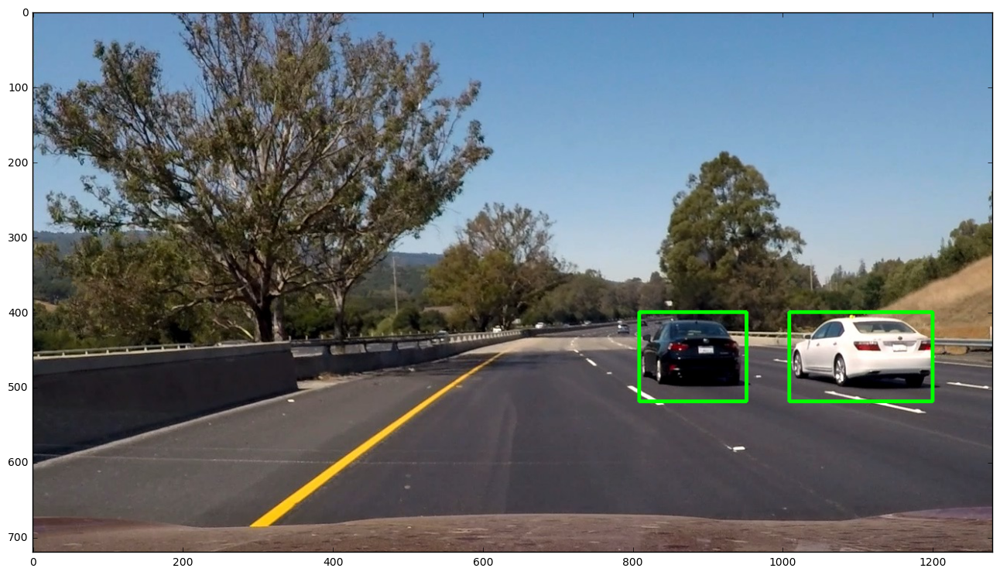

In [52]:
#-----------------------------------------------------
# Final Pipeline for Test Images !!!!!
#-----------------------------------------------------
def vehicle_detection_pipeline_image(image):
    
    #Variables
    color_space = 'YCrCb' # RGB, HSV, LUV, HLS, YUV, YCrCb
    xstart=np.int(image.shape[1]/2)
    spatial_size=(32,32) #Spatial Size
    hist_bins=32 # Number of Histogram Bin
    orient = 9  # HOG orientations
    pix_per_cell = 8 # HOG pixels per cell
    cell_per_block = 2 # HOG cells per block
    hog_channel = 'ALL' # 0, 1, 2, or "ALL"
    
    #Sliding window size & location 
    ystart=400
    ystop=600
    scale=1.0
    rectangles1 = find_cars(image, color_space, hog_channel, xstart, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)

    ystart=400
    ystop=600
    scale=1.5
    rectangles2 = find_cars(image, color_space, hog_channel, xstart, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)

    ystart=500
    ystop=700
    scale=2.0
    rectangles3 = find_cars(image, color_space, hog_channel, xstart, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)

    rectangles=rectangles1+rectangles2+rectangles3
    
    #Heat map and labeled box drawing
    heat_image = np.zeros_like(image[:,:,0])
    heat_image = add_heat(heat_image,rectangles)
    heat = apply_threshold(heat_image,1)
    labels=label(heat)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    draw_img=draw_labeled_bboxes(np.copy(image),labels)
    
    return draw_img

#Image Test!!
test_image= glob.glob('./test_images/test*.jpg')
for image in test_image:
    test_img=cv2.imread(image)
    det_img=vehicle_detection_pipeline_image(test_img)
    plt.figure(figsize=(21,9))
    plt.imshow(det_img)

In [53]:
#-----------------------------------------------------
# Class for Smoothing box, false positive removal
#-----------------------------------------------------

class Smooth():
    def __init__(self, n_smooth): 
        # Number of averaging size
        self.n_smooth=n_smooth
        self.rect_matrix=[]
        # Initial Average 
    
    def rectan_update(self,rectangles):
        # Append coefficient 
        self.rect_matrix.append(rectangles)
        
        # Exceed number of averaging size? 
        if len(self.rect_matrix) > self.n_smooth:
            self.rect_matrix.pop(0)
        else:
            pass
                
        # Averaging the coefficient 
        
        return self.rect_matrix

In [72]:
#-----------------------------------------------------
# Final Pipeline for Test Video !!!!!
#-----------------------------------------------------
def vehicle_detection_pipeline_video(image):
    
    #image=np.copy(image)
    #Variables
    color_space = 'YCrCb' # RGB, HSV, LUV, HLS, YUV, YCrCb
    xstart=np.int(image.shape[1]/2)
    spatial_size=(32,32) #Spatial Size
    hist_bins=32 # Number of Histogram Bin
    orient = 9  # HOG orientations
    pix_per_cell = 8 # HOG pixels per cell
    cell_per_block = 2 # HOG cells per block
    hog_channel = 'ALL' # 0, 1, 2, or "ALL"
    
    ystart=400
    ystop=600
    scale=1.0
    rectangles1 = find_cars(image, color_space, hog_channel, xstart, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)

    ystart=400
    ystop=600
    scale=1.5
    rectangles2 = find_cars(image, color_space, hog_channel, xstart, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)

    ystart=500
    ystop=700
    scale=2.0
    rectangles3 = find_cars(image, color_space, hog_channel, xstart, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)

    rectangles=rectangles1+rectangles2+rectangles3
    updated_rectangles = New_rec.rectan_update(rectangles)
    flatten = [x for sublist in updated_rectangles for x in sublist]
    heat_image = np.zeros_like(image[:,:,0])
    heat_image = add_heat(heat_image,flatten)
    heat = apply_threshold(heat_image,36)
    labels=label(heat)
    draw_img=draw_labeled_bboxes(np.copy(image),labels)
    
    return draw_img

In [73]:
#-----------------------------------------------------
# Final Video Process 
#-----------------------------------------------------

New_rec=Smooth(n_smooth=15)
def process(image):
    result = vehicle_detection_pipeline_video(image)
    return result

In [74]:
output_clip = 'project_video_out.mp4'
input_clip = VideoFileClip("project_video.mp4")
clip = input_clip.fl_image(process)
%time clip.write_videofile(output_clip, audio=False)

[MoviePy] >>>> Building video project_video_out.mp4
[MoviePy] Writing video project_video_out.mp4


100%|█████████████████████████████████████████████████████████████████████████████▉| 1260/1261 [07:25<00:00,  2.80it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_out.mp4 

Wall time: 7min 26s
